# TP3

## Integrantes
1. a1818 Daniel Fernando Peña Pinzon (danielfer.colt01@gmail.com)
2. a1820 Nicolas Pinzon Aparicio	(npinzonaparicio@gmail.com)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob

In [2]:
plt.figure(figsize=(12, 10))

<Figure size 1200x1000 with 0 Axes>

<Figure size 1200x1000 with 0 Axes>

In [3]:
def show_image(img, title="Image", cmap=None):
    plt.figure(figsize=(10, 8))
    if len(img.shape) == 3:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else:
        plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [4]:
def load_images(template_path, images_path):
    template = cv2.imread(template_path)
    if template is None:
        raise ValueError(f"No se pudo cargar el template desde {template_path}")

    template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

    print("Template:")
    show_image(template, "Template - Patrón de búsqueda")

    image_files = glob.glob(os.path.join(images_path, "*.png"))
    image_files.extend(glob.glob(os.path.join(images_path, "*.jpg")))

    images = []

    print(f"Se encontraron {len(image_files)} imágenes para procesar")

    for img_path in image_files:
        img = cv2.imread(img_path)
        if img is not None:
            img_name = os.path.basename(img_path)
            images.append((img_name, img))
            print(f"Cargada: {img_name}")

    return template, template_gray, images


In [5]:
def mark_template(image, detection, color=(0, 255, 0), thickness=2):
    value, location, shape_templ, scale = detection

    x1, y1 = int(location[0] / scale), int(location[1] / scale)
    h, w = int(shape_templ[0] / scale), int(shape_templ[1] / scale)
    x2, y2 = x1 + w, y1 + h

    img_copy = image.copy()

    # Dibujar el rectángulo
    cv2.rectangle(img_copy, (x1, y1), (x2, y2), color, thickness)

    # Valor de confianza
    text_y = y1 - 10 if y1 - 10 > 0 else y1 + 20
    cv2.putText(img_copy, f"Conf: {value:.2f}", (x1, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, thickness)

    return img_copy


In [6]:
def detect_single_logo(template_gray, image, threshold=0.7, method=cv2.TM_CCOEFF):
    template_edges = cv2.Canny(template_gray, 100, 200, L2gradient=True)

    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    h_image, w_image, _ = image.shape
    h_template, w_template = template_edges.shape

    max_scale = 5.0
    min_scale = max(h_template / h_image, w_template / w_image)
    scales = np.linspace(min_scale, max_scale, 100)

    best_results = []

    for scale in scales:
        try:
            # Escalar la imagen
            img_scaled = cv2.resize(image_gray, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
            img_edges = cv2.Canny(img_scaled, 100, 200, L2gradient=True)

            # Verificar que el template quepa en la imagen
            if img_edges.shape[0] < template_edges.shape[0] or img_edges.shape[1] < template_edges.shape[1]:
                continue

            result = cv2.matchTemplate(img_edges, template_edges, method)
            _, max_val, _, max_loc = cv2.minMaxLoc(result)

            if best_results == [] or max_val > best_results[0]:
                best_results = [max_val, max_loc, template_edges.shape, scale]

        except Exception as e:
            continue

    if best_results and best_results[0] >= threshold:
        return best_results
    else:
        return None

def process_all_images_single_detection(template_gray, images, threshold=0.7, method=cv2.TM_CCOEFF):
    results = []

    for img_name, image in images:
        detection = detect_single_logo(template_gray, image, threshold, method)

        if detection:
            result_img = mark_template(image, detection)
            title = f"{img_name} - Confianza: {detection[0]:.2f}, Escala: {detection[3]:.2f}"
            results.append((img_name, result_img, detection))
            show_image(result_img, title)
        else:
            print(f"No se detectó el logo en {img_name} con el umbral {threshold}")

    return results

In [7]:
def non_maximum_suppression(boxes, scores, threshold=0.2):
    if len(boxes) == 0:
        return []

    boxes = np.array(boxes)
    scores = np.array(scores)

    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]

    areas = (x2 - x1 + 1) * (y2 - y1 + 1)

    order = scores.argsort()[::-1]

    keep = []

    while order.size > 0:
        i = order[0]
        keep.append(i)

        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter)

        inds = np.where(iou <= threshold)[0]
        order = order[inds + 1]

    return keep

def detect_multiple_logos(template_gray, image, threshold=0.8, method=cv2.TM_CCOEFF):
    template_edges = cv2.Canny(template_gray, 100, 200, L2gradient=True)

    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    h_image, w_image, _ = image.shape
    h_template, w_template = template_edges.shape

    max_scale = 5.0
    min_scale = max(h_template / h_image, w_template / w_image)
    scales = np.linspace(min_scale, max_scale, 100)

    best_results = []

    for scale in scales:
        try:
            img_scaled = cv2.resize(image_gray, (0, 0), fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)
            img_edges = cv2.Canny(img_scaled, 100, 200, L2gradient=True)

            if img_edges.shape[0] < template_edges.shape[0] or img_edges.shape[1] < template_edges.shape[1]:
                continue

            result = cv2.matchTemplate(img_edges, template_edges, method)
            _, max_val, _, max_loc = cv2.minMaxLoc(result)

            if best_results == [] or max_val > best_results[0]:
                best_results = [max_val, max_loc, template_edges.shape, scale]

        except Exception as e:
            continue

    if not best_results:
        return []

    best_scale = best_results[3]
    img_scaled = cv2.resize(image_gray, (0, 0), fx=best_scale, fy=best_scale, interpolation=cv2.INTER_LINEAR)
    img_edges = cv2.Canny(img_scaled, 100, 200, L2gradient=True)

    result = cv2.matchTemplate(img_edges, template_edges, method)
    _, max_val, _, _ = cv2.minMaxLoc(result)

    locs = np.where(result >= max_val * threshold)

    boxes = []
    scores = []
    h_tmp, w_tmp = template_edges.shape

    for loc in zip(*locs[::-1]):
        x1, y1 = loc
        x2, y2 = x1 + w_tmp, y1 + h_tmp
        boxes.append((x1, y1, x2, y2))
        scores.append(result[y1, x1])

    keep_indices = non_maximum_suppression(boxes, scores)

    detections = []
    for idx in keep_indices:
        x1, y1, _, _ = boxes[idx]
        score = scores[idx]
        detections.append([score, (x1, y1), template_edges.shape, best_scale])

    return detections

def process_coca_multi(template_gray, images, threshold=0.8, method=cv2.TM_CCOEFF):
    for img_name, image in images:
        if img_name == "coca_multi.png":
            detections = detect_multiple_logos(template_gray, image, threshold=threshold, method=method)

            if detections:
                img_copy = image.copy()
                for detection in detections:
                    img_copy = mark_template(img_copy, detection)

                title = f"{img_name} - {len(detections)} detecciones"
                show_image(img_copy, title)
                return img_name, img_copy, detections
            else:
                print(f"No se detectaron logos en {img_name} con el umbral {threshold}")
                return img_name, image, []

    print("No se encontró la imagen coca_multi.png")
    return None


In [8]:
def process_all_images_multiple_detection(template_gray, images, threshold=0.8, method=cv2.TM_CCOEFF):
    results = []

    for img_name, image in images:
        detections = detect_multiple_logos(template_gray, image, threshold=threshold, method=method)

        if detections:
            img_copy = image.copy()
            for detection in detections:
                img_copy = mark_template(img_copy, detection)

            title = f"{img_name} - {len(detections)} detecciones"
            show_image(img_copy, title)
            results.append((img_name, img_copy, detections))
        else:
            print(f"No se detectaron logos en {img_name} con el umbral {threshold}")
            results.append((img_name, image, []))

    return results

=== Paso 0: Cargando template e imágenes ===
Template:


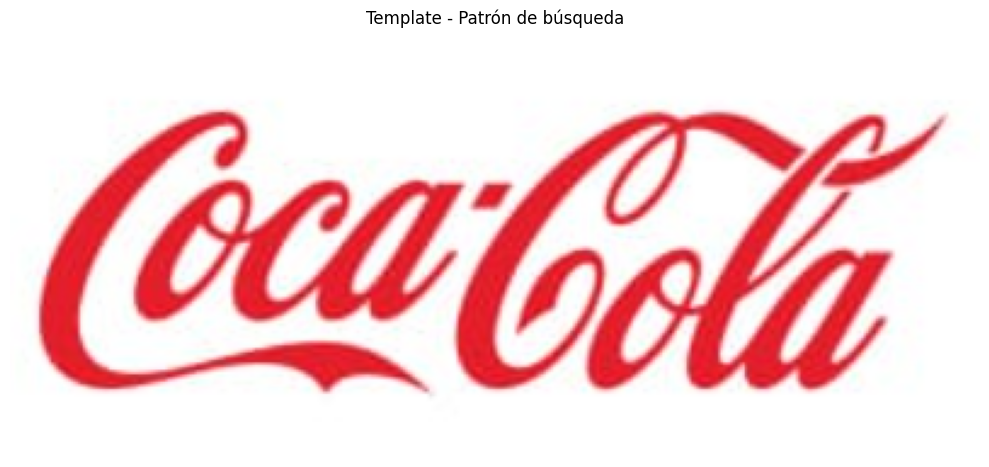

Se encontraron 7 imágenes para procesar
Cargada: coca_multi.png
Cargada: coca_logo_1.png
Cargada: coca_retro_1.png
Cargada: logo_1.png
Cargada: coca_logo_2.png
Cargada: coca_retro_2.png
Cargada: COCA-COLA-LOGO.jpg

=== Paso 1: Detectar una instancia del logo en cada imagen ===


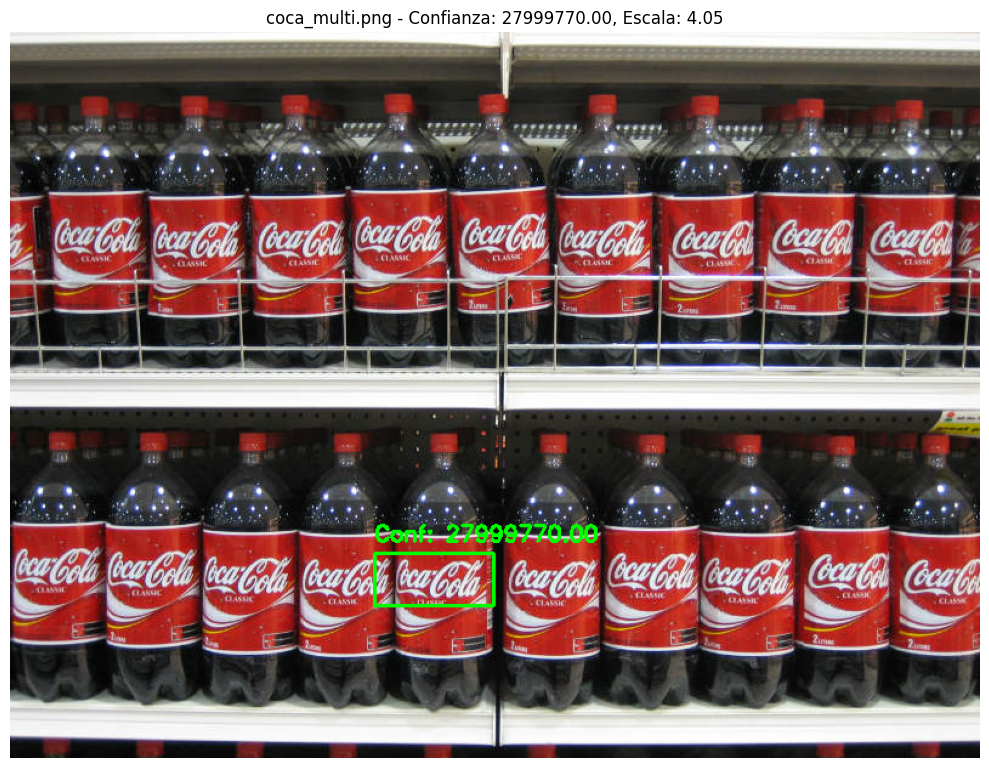

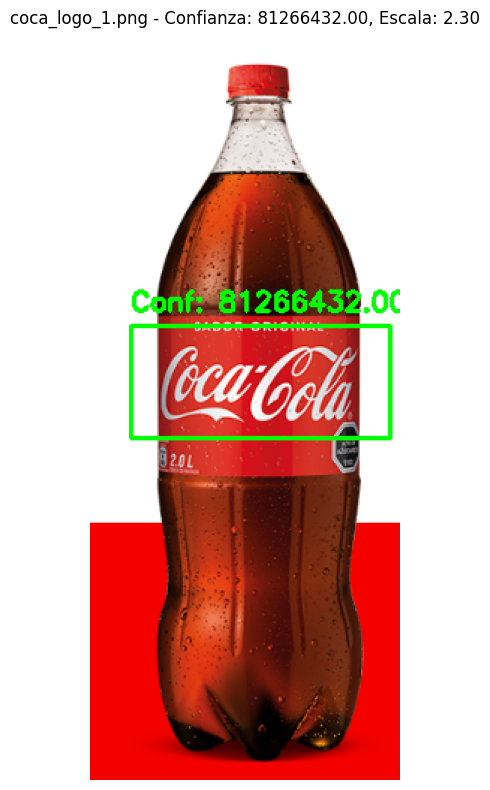

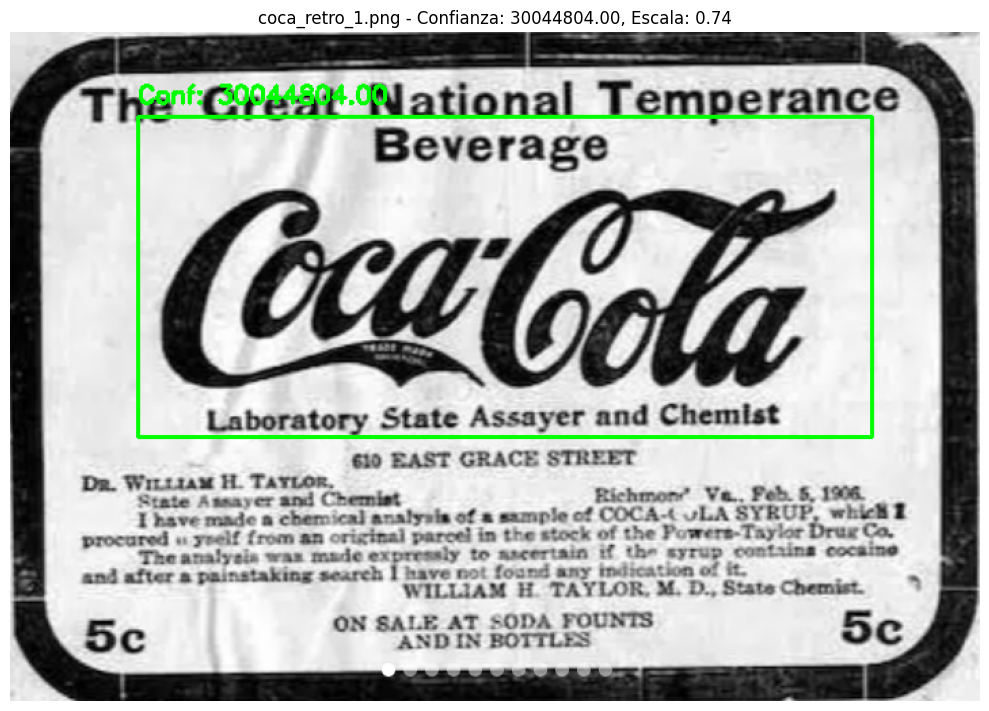

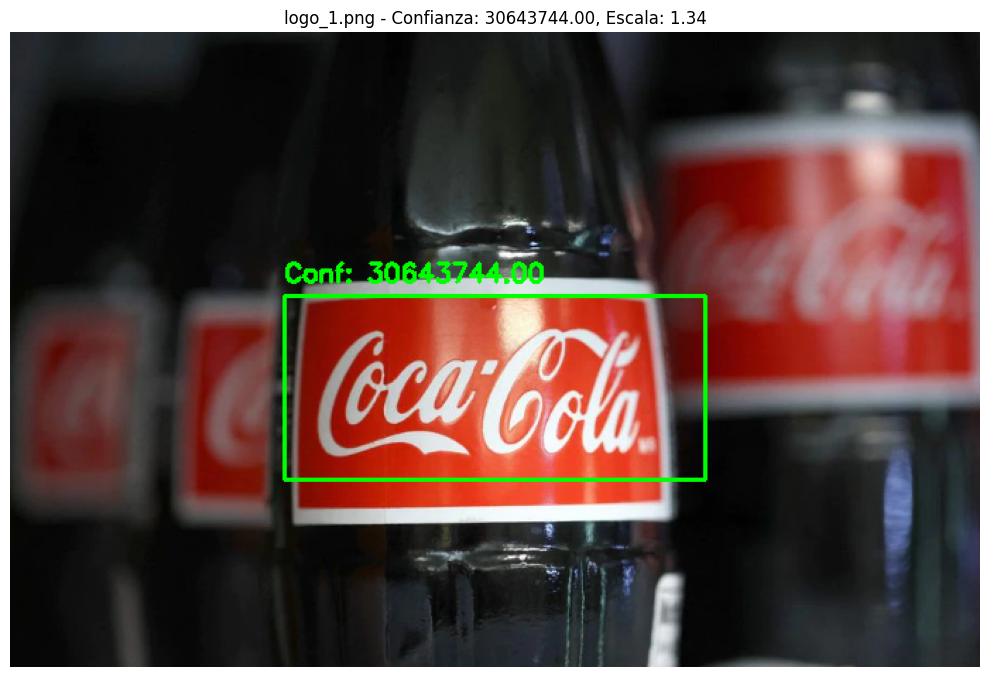

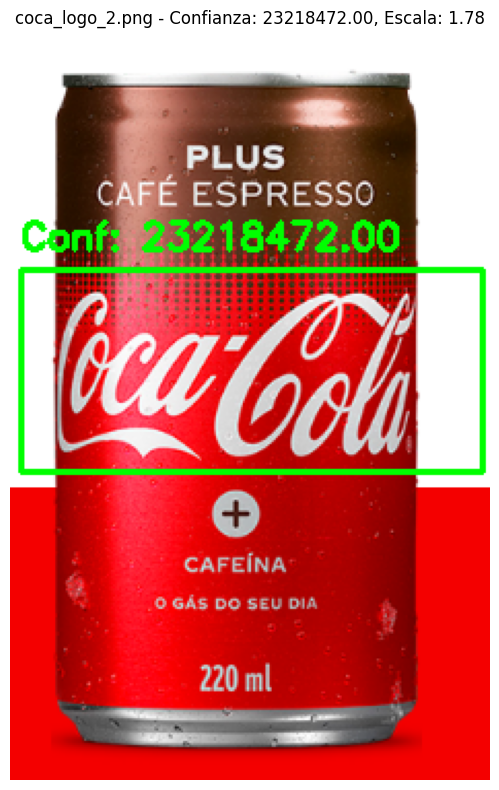

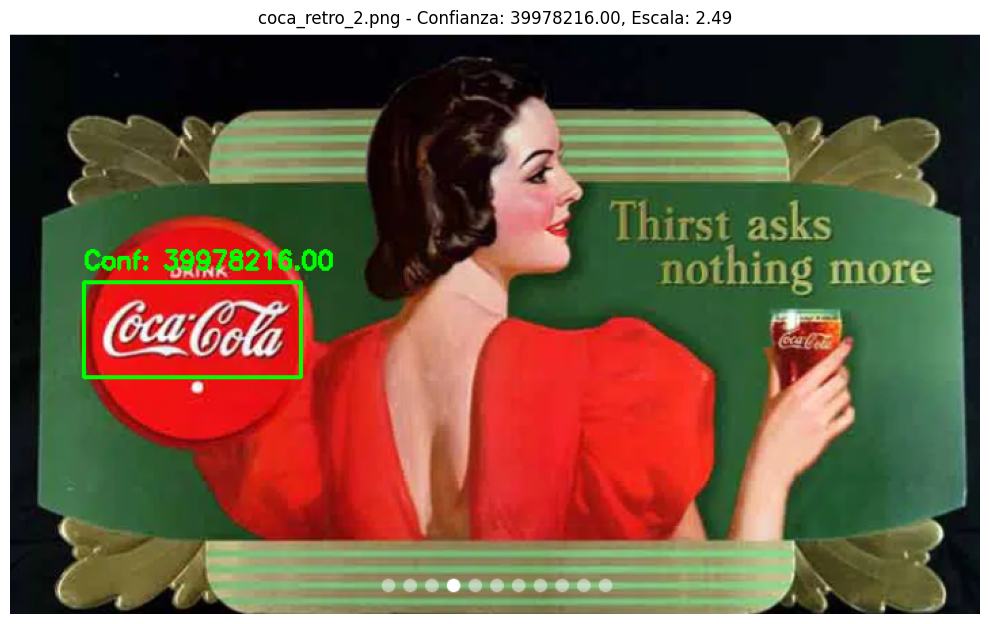

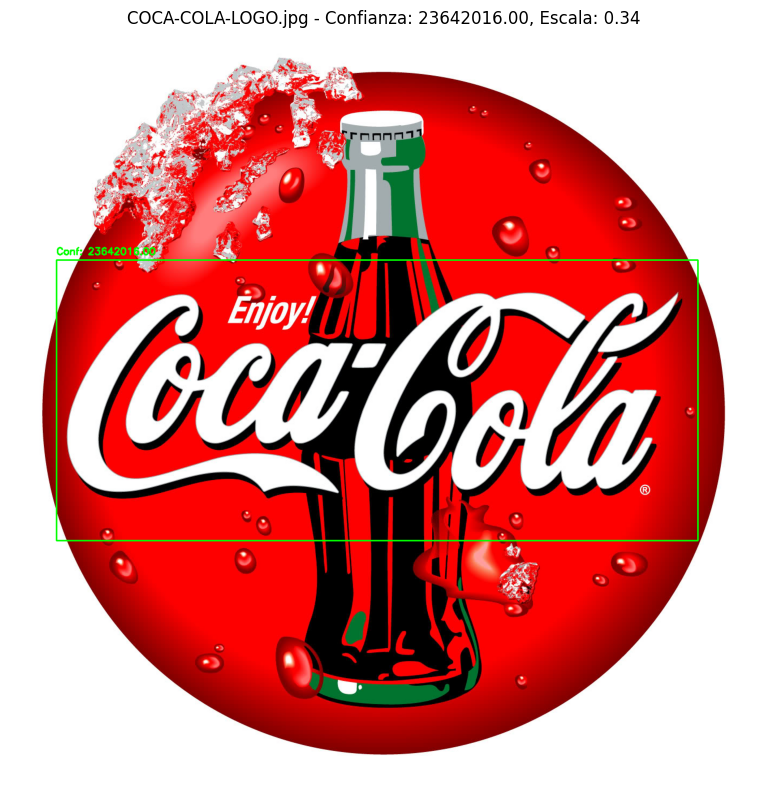


=== Paso 2: Detectar múltiples instancias en coca_multi.png ===


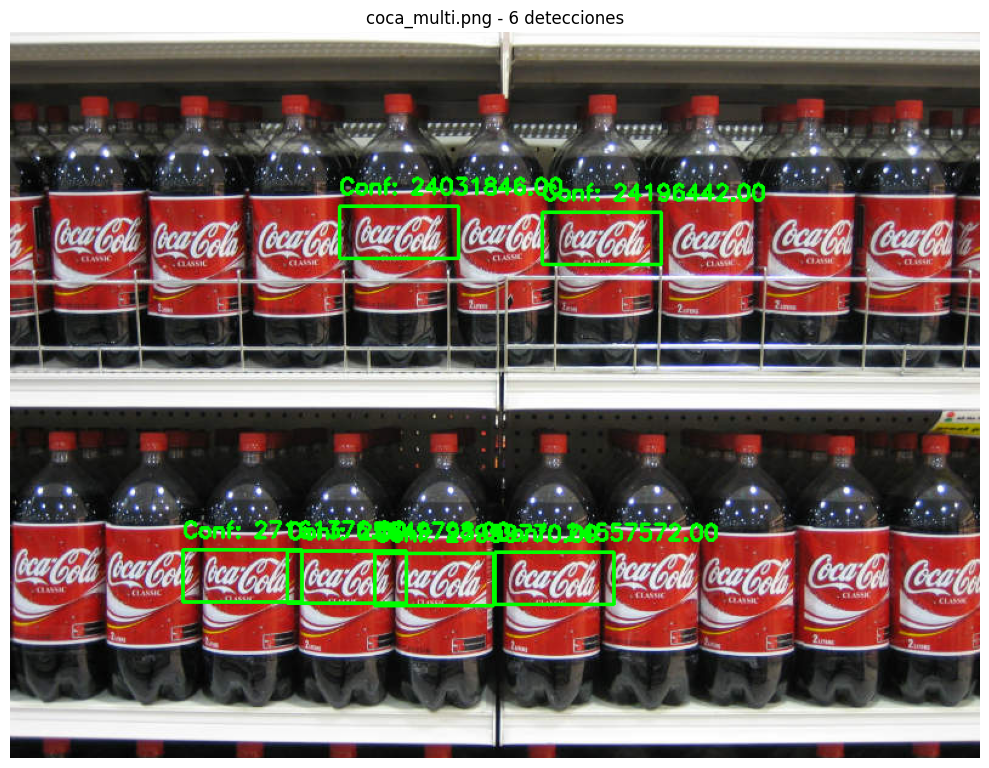


=== Paso 3: Generalizar la detección múltiple para todas las imágenes ===


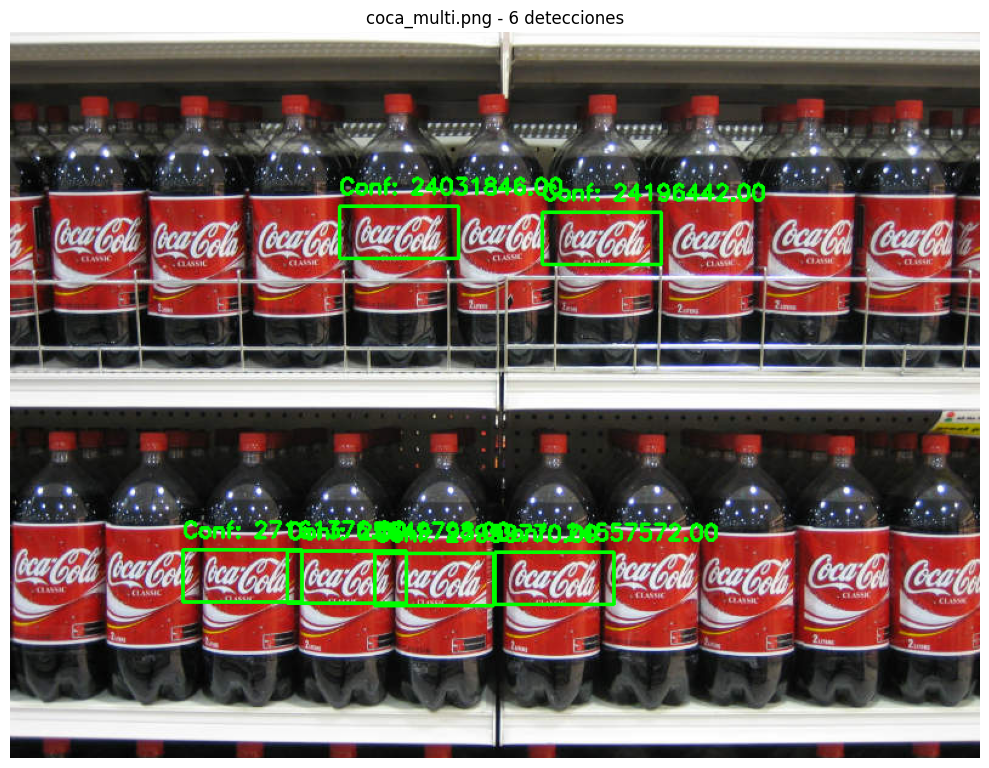

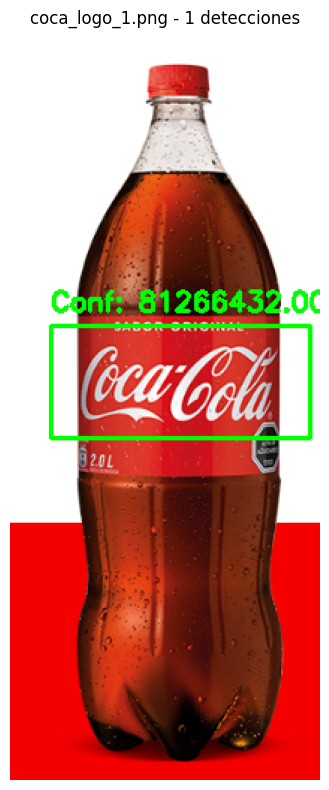

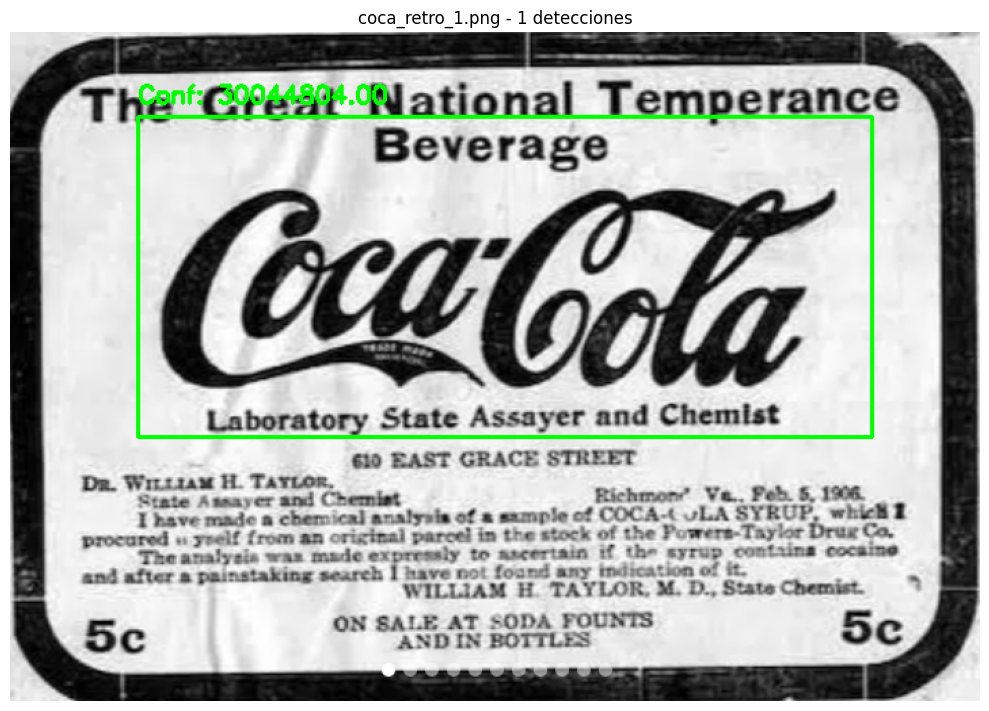

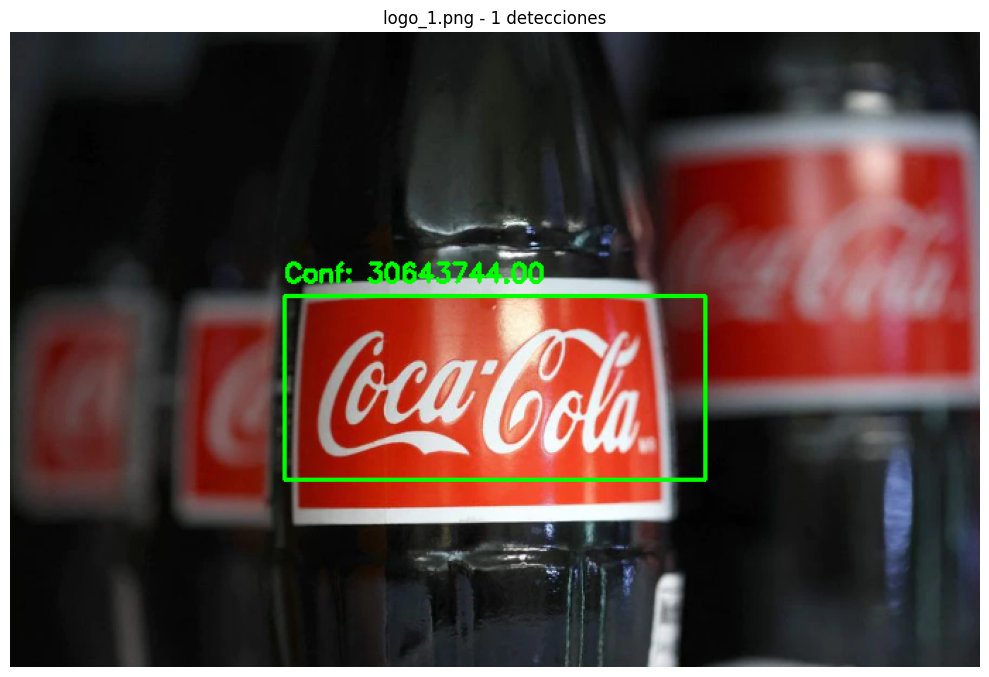

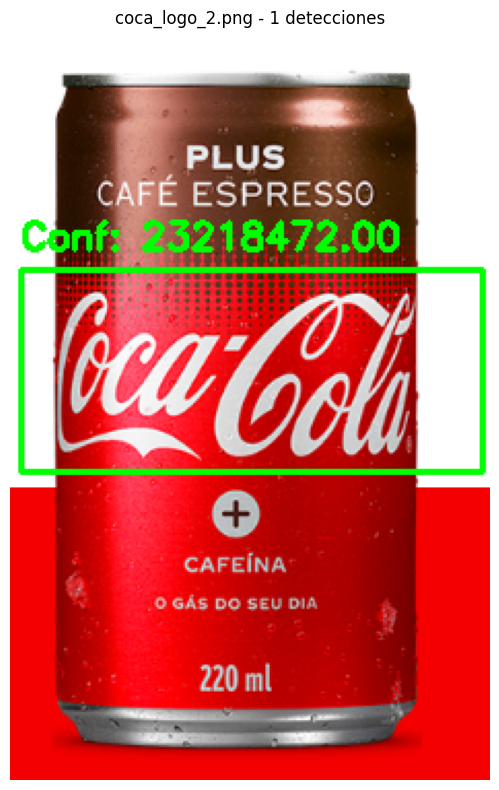

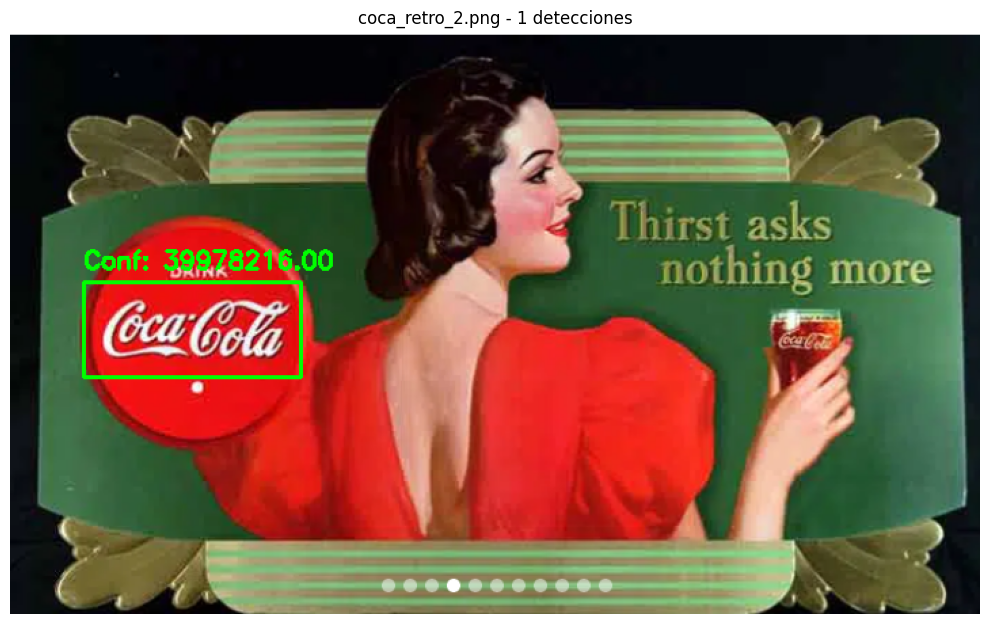

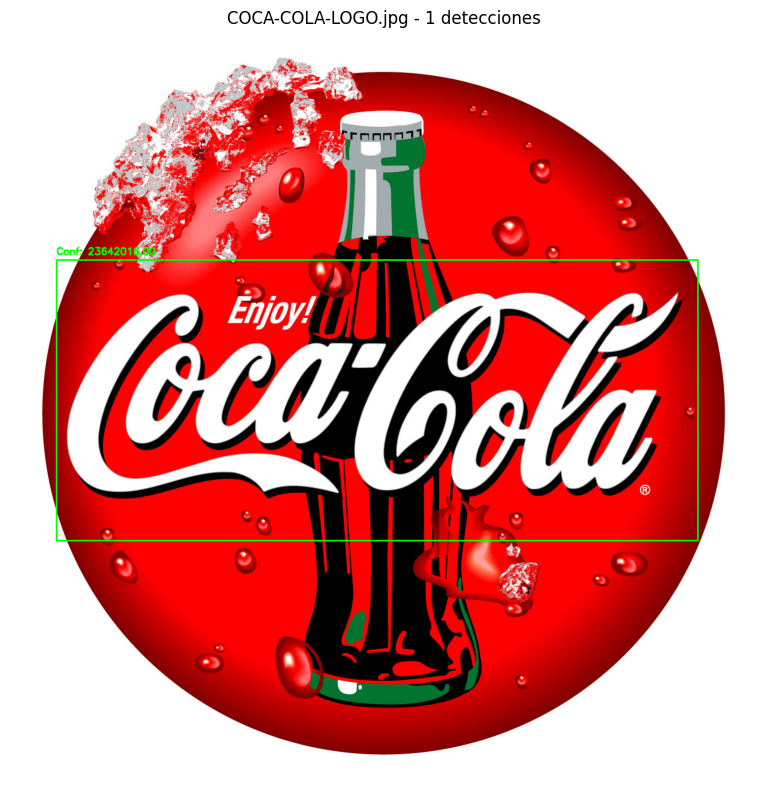


=== Resumen de resultados ===
Total de imágenes procesadas: 7
Detecciones únicas encontradas: 7
Detecciones en coca_multi.png: 6
Detecciones múltiples (todas las imágenes): 12


In [9]:
def run_tp3(template_path, images_path):
    print("=== Paso 0: Cargando template e imágenes ===")
    template, template_gray, images = load_images(template_path, images_path)

    print("\n=== Paso 1: Detectar una instancia del logo en cada imagen ===")
    single_results = process_all_images_single_detection(template_gray, images, threshold=0.5, method=cv2.TM_CCOEFF)

    print("\n=== Paso 2: Detectar múltiples instancias en coca_multi.png ===")
    multi_result = process_coca_multi(template_gray, images, threshold=0.8, method=cv2.TM_CCOEFF)

    print("\n=== Paso 3: Generalizar la detección múltiple para todas las imágenes ===")
    all_results = process_all_images_multiple_detection(template_gray, images, threshold=0.8, method=cv2.TM_CCOEFF)

    return template, template_gray, images, single_results, multi_result, all_results

template_path = "template/pattern.png"
images_path = "images"

if __name__ == "__main__":
    template, template_gray, images, single_results, multi_result, all_results = run_tp3(template_path, images_path)

    print("\n=== Resumen de resultados ===")
    print(f"Total de imágenes procesadas: {len(images)}")
    print(f"Detecciones únicas encontradas: {len(single_results)}")

    if multi_result:
        print(f"Detecciones en coca_multi.png: {len(multi_result[2])}")

    print(f"Detecciones múltiples (todas las imágenes): {sum(len(detections) for _, _, detections in all_results)}")